In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx

In [2]:
names_df = pd.read_csv('D:/Actor_Network/data/name.basics.tsv/data.tsv',sep='\t')

In [3]:
names_df

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"soundtrack,actor,miscellaneous","tt0031983,tt0050419,tt0053137,tt0072308"
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack","tt0038355,tt0037382,tt0117057,tt0071877"
2,nm0000003,Brigitte Bardot,1934,\N,"actress,soundtrack,music_department","tt0049189,tt0054452,tt0057345,tt0056404"
3,nm0000004,John Belushi,1949,1982,"actor,soundtrack,writer","tt0077975,tt0080455,tt0078723,tt0072562"
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","tt0060827,tt0083922,tt0050976,tt0050986"
...,...,...,...,...,...,...
11924217,nm9993714,Romeo del Rosario,\N,\N,"animation_department,art_department","tt14069590,tt11657662,tt2455546"
11924218,nm9993716,Essias Loberg,\N,\N,NaN,\N
11924219,nm9993717,Harikrishnan Rajan,\N,\N,cinematographer,tt8736744
11924220,nm9993718,Aayush Nair,\N,\N,cinematographer,\N


In [4]:
titles_df=pd.read_csv('D:/Actor_Network/data/title.basics.tsv/data.tsv',sep='\t')

C:\Users\prade\AppData\Local\Temp\ipykernel_7448\1820054059.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  titles_df=pd.read_csv('D:/Actor_Network/data/title.basics.tsv/data.tsv',sep='\t')


In [5]:
titles_df

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
0,tt0000001,short,Carmencita,Carmencita,0,1894,\N,1,"Documentary,Short"
1,tt0000002,short,Le clown et ses chiens,Le clown et ses chiens,0,1892,\N,5,"Animation,Short"
2,tt0000003,short,Pauvre Pierrot,Pauvre Pierrot,0,1892,\N,4,"Animation,Comedy,Romance"
3,tt0000004,short,Un bon bock,Un bon bock,0,1892,\N,12,"Animation,Short"
4,tt0000005,short,Blacksmith Scene,Blacksmith Scene,0,1893,\N,1,"Comedy,Short"
...,...,...,...,...,...,...,...,...,...
9223785,tt9916848,tvEpisode,Episode #3.17,Episode #3.17,0,2010,\N,\N,"Action,Drama,Family"
9223786,tt9916850,tvEpisode,Episode #3.19,Episode #3.19,0,2010,\N,\N,"Action,Drama,Family"
9223787,tt9916852,tvEpisode,Episode #3.20,Episode #3.20,0,2010,\N,\N,"Action,Drama,Family"
9223788,tt9916856,short,The Wind,The Wind,0,2015,\N,27,Short


In [6]:
top_actors_df=pd.read_csv('D:/Actor_Network/data/top_actor.csv')

In [7]:
top_actors_df

,Actor
0,Akshay Kumar
1,Ranveer Singh
2,Salman Khan
3,Prabhas
4,Sanjay Dutt
...,...
95,Tahir Raj Bhasin
96,Sooraj Pancholi
97,Jackie Shroff
98,Neil Bhoopalam


In [8]:
actors_df=names_df[(names_df['primaryProfession'].str.contains('actor')|
                  names_df['primaryProfession'].str.contains('actress'))&
                  names_df['knownForTitles'].str.contains('tt')].reset_index(drop=True)

In [9]:
top_actors = top_actors_df['Actor'].tolist()

In [10]:
actors_df = actors_df[actors_df['primaryName'].isin(top_actors)]

In [11]:
pd.set_option('display.max_rows', None)

In [12]:
actors_df

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
723,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890"
2594,nm0004335,Hrithik Roshan,1974,\N,"actor,assistant_director,music_department","tt1562872,tt0254481,tt0441048,tt0449994"
2638,nm0004429,Dharmendra,1935,\N,"actor,producer,miscellaneous","tt0099652,tt0073707,tt0233147,tt0070935"
2694,nm0004569,Sanjay Dutt,1959,\N,"actor,music_department,soundtrack","tt0374887,tt0456144,tt0294662,tt1849718"
3813,nm0006763,Jackie Shroff,1957,\N,"actor,producer,soundtrack","tt0102636,tt0248185,tt9095260,tt0238936"
3825,nm0006795,Salman Khan,1965,\N,"producer,actor,soundtrack","tt4832640,tt3863552,tt2016894,tt1729637"
3944,nm0007113,Nana Patekar,1951,\N,"actor,music_department,director","tt0476884,tt0110280,tt0451631,tt0102701"
4005,nm0007228,Fardeen Khan,1972,\N,"actor,soundtrack","tt0281102,tt0210920,tt0422236,tt0451833"
4988,nm0008944,John Abraham,\N,\N,actor,tt0117802
4989,nm0008945,John Abraham,\N,\N,actor,tt0005935


In [13]:
actors_df = actors_df[actors_df['birthYear']!='\\N']

In [14]:
actors_df

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
723,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890"
2594,nm0004335,Hrithik Roshan,1974,\N,"actor,assistant_director,music_department","tt1562872,tt0254481,tt0441048,tt0449994"
2638,nm0004429,Dharmendra,1935,\N,"actor,producer,miscellaneous","tt0099652,tt0073707,tt0233147,tt0070935"
2694,nm0004569,Sanjay Dutt,1959,\N,"actor,music_department,soundtrack","tt0374887,tt0456144,tt0294662,tt1849718"
3813,nm0006763,Jackie Shroff,1957,\N,"actor,producer,soundtrack","tt0102636,tt0248185,tt9095260,tt0238936"
3825,nm0006795,Salman Khan,1965,\N,"producer,actor,soundtrack","tt4832640,tt3863552,tt2016894,tt1729637"
3944,nm0007113,Nana Patekar,1951,\N,"actor,music_department,director","tt0476884,tt0110280,tt0451631,tt0102701"
4005,nm0007228,Fardeen Khan,1972,\N,"actor,soundtrack","tt0281102,tt0210920,tt0422236,tt0451833"
7022,nm0012778,Aftab Shivdasani,1978,\N,"actor,writer,producer","tt0319020,tt1024943,tt0214931,tt0406977"
25234,nm0045393,Abhishek Bachchan,1976,\N,"actor,music_department,soundtrack","tt1185420,tt0432047,tt0499375,tt2461132"


In [15]:
name_duplicates_df = actors_df[actors_df.duplicated('primaryName')]['primaryName'].unique().tolist()

In [16]:
name_duplicates_df

['Sunny Deol', 'Mithun Chakraborty', 'Rishi Kapoor', 'Siddharth']

In [17]:
filtered_name_duplicates = ['nm0219971', #Sunny Deol
                            'nm0149822', #Mithun Chakraborty
                            'nm0438501', #Rishi Kapoor
                            'nm1413459', #Siddharth 
                           ]
filtered_name_duplicates_df = actors_df[actors_df['nconst'].isin(filtered_name_duplicates)]

In [18]:
filtered_name_duplicates_df

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
81469,nm0149822,Mithun Chakraborty,1950,\N,"actor,music_department,writer","tt0499375,tt8108268,tt0454314,tt2283748"
119839,nm0219971,Sunny Deol,1956,\N,"actor,producer,director","tt0284137,tt0118751,tt0099652,tt0109555"
234713,nm0438501,Rishi Kapoor,1952,2020,"actor,soundtrack,music_department","tt1849718,tt4900716,tt1275863,tt0886539"
1394515,nm1413459,Siddharth,1979,\N,"actor,music_department,soundtrack","tt0405508,tt2624704,tt0455663,tt3569782"


In [19]:
actors_df = actors_df.drop_duplicates ('primaryName', keep=False) 
actors_df = pd.concat([actors_df, filtered_name_duplicates_df])\
.reset_index(drop=True) 

In [20]:
actors_df

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890"
1,nm0004335,Hrithik Roshan,1974,\N,"actor,assistant_director,music_department","tt1562872,tt0254481,tt0441048,tt0449994"
2,nm0004429,Dharmendra,1935,\N,"actor,producer,miscellaneous","tt0099652,tt0073707,tt0233147,tt0070935"
3,nm0004569,Sanjay Dutt,1959,\N,"actor,music_department,soundtrack","tt0374887,tt0456144,tt0294662,tt1849718"
4,nm0006763,Jackie Shroff,1957,\N,"actor,producer,soundtrack","tt0102636,tt0248185,tt9095260,tt0238936"
5,nm0006795,Salman Khan,1965,\N,"producer,actor,soundtrack","tt4832640,tt3863552,tt2016894,tt1729637"
6,nm0007113,Nana Patekar,1951,\N,"actor,music_department,director","tt0476884,tt0110280,tt0451631,tt0102701"
7,nm0007228,Fardeen Khan,1972,\N,"actor,soundtrack","tt0281102,tt0210920,tt0422236,tt0451833"
8,nm0012778,Aftab Shivdasani,1978,\N,"actor,writer,producer","tt0319020,tt1024943,tt0214931,tt0406977"
9,nm0045393,Abhishek Bachchan,1976,\N,"actor,music_department,soundtrack","tt1185420,tt0432047,tt0499375,tt2461132"


In [21]:
for actor in top_actors: 
    if actor not in actors_df['primaryName'].unique().tolist():
        print(actor)

Ram Charan
Jr NTR
R Madhavan
Sunny Singh Nijjar
Kunal Kemmu
Aditya Roy Kapur
Pulkit Samrat
Ishaan Khatter
Vir Das
Parambrata Chatterjee
Jimmy Sheirgill
Prabhu Dheva
Ashish Chowdhry
Himansh Kohli
Devanshu Sharma
Girish Taurani
Sooraj Pancholi


In [22]:
missing_names = ['nm2776304', #Ram Charan
                 'nm1694524', #Jr NTR
                 'rm0534856', #R Madhavan 
                 'nm2194798', #Sunny Singh Nijjar
                 'nm0447240', #Kunal Kemmu
                 'nm3169069', #Aditya Roy Kapur
                 'rm4992002', #Pulkit Samrat 
                 'nm2020109', #Ishaan Khatter
                 'nm1983888', #Vir Das
                 'nm1913625', #Parambrata Chatterjee
                 'rm0792116', #Jimmy Sheirgill 
                 'nm0222150', #Prabhu Dheva
                 'nm0996627', #Ashish Chowdhry
                 'nm4946996', #Himansh Kohli
                 'rm5240573', #Girish Taurani 
                 'nm4808460', #Sooraj Pancholi
                ]

In [23]:
missing_names_df = names_df[names_df['nconst'].isin(missing_names)] 
actors_df = pd.concat([actors_df, missing_names_df])\
           .reset_index(drop=True) #Combine actors_df with top actors that were not in actors_df

In [24]:
actors_df

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890"
1,nm0004335,Hrithik Roshan,1974,\N,"actor,assistant_director,music_department","tt1562872,tt0254481,tt0441048,tt0449994"
2,nm0004429,Dharmendra,1935,\N,"actor,producer,miscellaneous","tt0099652,tt0073707,tt0233147,tt0070935"
3,nm0004569,Sanjay Dutt,1959,\N,"actor,music_department,soundtrack","tt0374887,tt0456144,tt0294662,tt1849718"
4,nm0006763,Jackie Shroff,1957,\N,"actor,producer,soundtrack","tt0102636,tt0248185,tt9095260,tt0238936"
5,nm0006795,Salman Khan,1965,\N,"producer,actor,soundtrack","tt4832640,tt3863552,tt2016894,tt1729637"
6,nm0007113,Nana Patekar,1951,\N,"actor,music_department,director","tt0476884,tt0110280,tt0451631,tt0102701"
7,nm0007228,Fardeen Khan,1972,\N,"actor,soundtrack","tt0281102,tt0210920,tt0422236,tt0451833"
8,nm0012778,Aftab Shivdasani,1978,\N,"actor,writer,producer","tt0319020,tt1024943,tt0214931,tt0406977"
9,nm0045393,Abhishek Bachchan,1976,\N,"actor,music_department,soundtrack","tt1185420,tt0432047,tt0499375,tt2461132"


In [25]:
titles_df = titles_df[titles_df['titleType']=='movie']

In [26]:
name_IDs = actors_df['nconst'].tolist() 

In [30]:
data1 = pd.read_csv('D:/Actor_Network/data/universal.csv',sep='\t') # This dataset is created from principals data frame and titles dataframe

In [31]:
data1

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles,tconst,averageRating,numVotes,ordering,category,job,characters
0,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0066763,8.1,33843,2,actor,\N,"[""Dr. Bhaskar K. Bannerjee"",""Babu Moshai""]"
1,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0067555,6.7,210,2,actor,\N,"[""Kumar Sen""]"
2,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0067636,6.0,97,2,actor,\N,"[""Ram G. Chandra""]"
3,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0068255,5.2,58,1,actor,\N,"[""Birju""]"
4,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0068305,6.8,1185,3,actor,\N,"[""Ravi Kumar""]"
5,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0068532,5.7,115,1,actor,\N,"[""Manmohan Akash Tyagi""]"
6,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0068753,6.3,25,3,actor,\N,"[""Dalaljit (Guest Appearance)""]"
7,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0069152,5.6,104,1,actor,\N,"[""Jai Shankar Rai""]"
8,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0069218,5.7,151,2,actor,\N,"[""Mohan""]"
9,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0069671,7.8,2814,1,actor,\N,"[""Subir Kumar (Beeru)""]"


In [32]:
test=pd.read_csv('D:/Actor_Network/data/title.basics.tsv/data.tsv',sep='\t')

C:\Users\prade\AppData\Local\Temp\ipykernel_7448\3155510775.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  test=pd.read_csv('D:/Actor_Network/data/title.basics.tsv/data.tsv',sep='\t')


In [33]:
data1=pd.merge(data1, test, on="tconst")

In [34]:
data1

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles,tconst,averageRating,numVotes,ordering,...,job,characters,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
0,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0066763,8.1,33843,2,...,\N,"[""Dr. Bhaskar K. Bannerjee"",""Babu Moshai""]",movie,Anand,Anand,0,1971,\N,122,"Drama,Musical"
1,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0067555,6.7,210,2,...,\N,"[""Kumar Sen""]",movie,Parwana,Parwana,0,1971,\N,93,"Romance,Thriller"
2,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0067636,6.0,97,2,...,\N,"[""Ram G. Chandra""]",movie,Pyar Ki Kahani,Pyar Ki Kahani,0,1971,\N,150,"Drama,Romance"
3,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0068255,5.2,58,1,...,\N,"[""Birju""]",movie,Bansi Birju,Bansi Birju,0,1972,\N,116,"Drama,Romance"
4,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0068305,6.8,1185,3,...,\N,"[""Ravi Kumar""]",movie,Bombay to Goa,Bombay to Goa,0,1972,\N,132,"Action,Adventure,Comedy"
5,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0068532,5.7,115,1,...,\N,"[""Manmohan Akash Tyagi""]",movie,Ek Nazar,Ek Nazar,0,1972,\N,\N,"Drama,Romance"
6,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0068753,6.3,25,3,...,\N,"[""Dalaljit (Guest Appearance)""]",movie,Jaban,Jaban,0,1972,\N,\N,\N
7,nm0004429,Dharmendra,1935,\N,"actor,producer,miscellaneous","tt0099652,tt0073707,tt0233147,tt0070935",tt0068753,6.3,25,4,...,\N,"[""(Guest Appearance)""]",movie,Jaban,Jaban,0,1972,\N,\N,\N
8,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0069152,5.6,104,1,...,\N,"[""Jai Shankar Rai""]",movie,Raaste Kaa Patthar,Raaste Kaa Patthar,0,1972,\N,133,"Drama,Romance"
9,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0069218,5.7,151,2,...,\N,"[""Mohan""]",movie,Sanjog,Sanjog,0,1972,\N,150,"Comedy,Drama,Family"


In [35]:
data1= data1[data1['genres'].str.contains('Action')]

In [36]:
data1

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles,tconst,averageRating,numVotes,ordering,...,job,characters,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
4,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0068305,6.8,1185,3,...,\N,"[""Ravi Kumar""]",movie,Bombay to Goa,Bombay to Goa,0,1972,\N,132,"Action,Adventure,Comedy"
11,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0069751,5.6,118,2,...,\N,"[""Dual Role (Shyamu & Deepak)""]",movie,Bandhe Haath,Bandhe Haath,0,1973,\N,139,"Action,Drama"
12,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0070097,5.5,145,3,...,\N,"[""Ratan""]",movie,Gehri Chaal,Gehri Chaal,0,1973,\N,147,"Action,Crime,Thriller"
15,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0070947,7.5,3995,1,...,\N,"[""Insp. Vijay Khanna""]",movie,Zanjeer,Zanjeer,0,1973,\N,145,"Action,Crime,Drama"
21,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0072860,8.0,11079,1,...,\N,"[""Vijay Verma""]",movie,Deewaar,Deewaar,0,1975,\N,174,"Action,Crime,Drama"
22,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0072972,6.7,338,3,...,\N,"[""Rajesh (Raj)""]",movie,Faraar,Faraar,0,1975,\N,136,"Action,Crime,Drama"
23,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0073104,6.6,1072,3,...,\N,"[""Vijay""]",movie,Hera Pheri,Hera Pheri,0,1976,\N,164,"Action,Comedy,Crime"
25,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0073707,8.1,55723,3,...,\N,"[""Jai""]",movie,Sholay,Sholay,0,1975,\N,204,"Action,Adventure,Comedy"
26,nm0004429,Dharmendra,1935,\N,"actor,producer,miscellaneous","tt0099652,tt0073707,tt0233147,tt0070935",tt0073707,8.1,55723,2,...,\N,"[""Veeru""]",movie,Sholay,Sholay,0,1975,\N,204,"Action,Adventure,Comedy"
27,nm0000821,Amitabh Bachchan,1942,\N,"actor,producer,writer","tt0337578,tt5571734,tt0375611,tt0213890",tt0073924,6.0,375,3,...,\N,"[""Badal""]",movie,Zameer,Zameer,0,1975,\N,136,"Action,Drama"


In [37]:
name_title_dict = data1.groupby('nconst')['tconst'].apply(list).to_dict()

In [38]:
name_title_dict

{'nm0000821': ['tt0068305',
  'tt0069751',
  'tt0070097',
  'tt0070947',
  'tt0072860',
  'tt0072972',
  'tt0073104',
  'tt0073707',
  'tt0073924',
  'tt0075632',
  'tt0075669',
  'tt0076177',
  'tt0076259',
  'tt0076527',
  'tt0077226',
  'tt0077451',
  'tt0077596',
  'tt0077792',
  'tt0078418',
  'tt0079236',
  'tt0079386',
  'tt0079584',
  'tt0079963',
  'tt0080638',
  'tt0080653',
  'tt0081401',
  'tt0081491',
  'tt0082594',
  'tt0082644',
  'tt0082797',
  'tt0083349',
  'tt0083820',
  'tt0084199',
  'tt0084385',
  'tt0084393',
  'tt0084630',
  'tt0084667',
  'tt0085165',
  'tt0085361',
  'tt0085886',
  'tt0086156',
  'tt0087474',
  'tt0089194',
  'tt0089552',
  'tt0090575',
  'tt0093949',
  'tt0095198',
  'tt0098491',
  'tt0098976',
  'tt0098999',
  'tt0101283',
  'tt0101284',
  'tt0102071',
  'tt0102119',
  'tt0104607',
  'tt0118673',
  'tt0119721',
  'tt0172704',
  'tt0172761',
  'tt0207513',
  'tt0213775',
  'tt0214178',
  'tt0289845',
  'tt0294662',
  'tt0315642',
  'tt0320097

In [39]:
name_IDs = actors_df['nconst'].tolist() 
names = actors_df['primaryName'].tolist() 
ID_name_dict = dict(zip(name_IDs, names))

In [40]:
ID_name_dict

{'nm0000821': 'Amitabh Bachchan',
 'nm0004335': 'Hrithik Roshan',
 'nm0004429': 'Dharmendra',
 'nm0004569': 'Sanjay Dutt',
 'nm0006763': 'Jackie Shroff',
 'nm0006795': 'Salman Khan',
 'nm0007113': 'Nana Patekar',
 'nm0007228': 'Fardeen Khan',
 'nm0012778': 'Aftab Shivdasani',
 'nm0045393': 'Abhishek Bachchan',
 'nm0048075': 'Manoj Bajpayee',
 'nm0159167': 'Uday Chopra',
 'nm0196375': 'Parvin Dabas',
 'nm0219967': 'Bobby Deol',
 'nm0222426': 'Ajay Devgn',
 'nm0332871': 'Govinda',
 'nm0393535': 'Randeep Hooda',
 'nm0412917': 'Jaaved Jaaferi',
 'nm0430817': 'Sharman Joshi',
 'nm0438463': 'Anil Kapoor',
 'nm0451148': 'Aamir Khan',
 'nm0451174': 'Arshad Warsi',
 'nm0451234': 'Irrfan Khan',
 'nm0451307': 'Saif Ali Khan',
 'nm0451321': 'Shah Rukh Khan',
 'nm0451379': 'Akshaye Khanna',
 'nm0451600': 'Anupam Kher',
 'nm0457410': 'Ravi Kishan',
 'nm0474774': 'Akshay Kumar',
 'nm0707425': 'Rajinikanth',
 'nm0712546': 'Paresh Rawal',
 'nm0787462': 'Naseeruddin Shah',
 'nm0792911': 'Suniel Shetty',

In [41]:
title_IDs = titles_df['tconst'].tolist()
titles = titles_df['primaryTitle'].tolist() 
ID_title_dict = dict(zip(title_IDs, titles))

In [42]:
titles

['Miss Jerry',
 'Bohemios',
 'The Story of the Kelly Gang',
 'The Prodigal Son',
 'Robbery Under Arms',
 'Hamlet',
 'Don Quijote',
 'The Fairylogue and Radio-Plays',
 'Andreas Hofer',
 'La bocana de Mar Chica',
 'A Cultura do Cacau',
 'De Garraf a Barcelona',
 'Un día en Xochimilco',
 'Los dos hermanos',
 'Fabricación del corcho en Sant Feliu de Guixols',
 'Faldgruben',
 'Fiesta de toros',
 'Fiestas de Santa Lucía - Belenes',
 'Fiestas en La Garriga',
 'Gira política de Madero y Pino Suárez',
 'Hamlet, Prince of Denmark',
 'Locura de amor',
 'Lægens offer',
 'Melilla y el Gurugu',
 'Niños en la alameda',
 'La primera y segunda casetas',
 'Protección de un convoy de víveres en el puente de camellos',
 'Salome Mad',
 'Sherlock Holmes VI',
 "Smith's Knockabout Theatre",
 'Gøngehøvdingen',
 'El sueño milagroso',
 'O Terremoto de Benavente',
 'Toma del Gurugu',
 'Two of the Boys',
 'La vida en el campamento',
 'Viernes de dolores',
 "Abraham Lincoln's Clemency",
 "L'aluminite",
 'Amleto',
 

In [43]:
ID_title_dict

{'tt0000009': 'Miss Jerry',
 'tt0000502': 'Bohemios',
 'tt0000574': 'The Story of the Kelly Gang',
 'tt0000591': 'The Prodigal Son',
 'tt0000615': 'Robbery Under Arms',
 'tt0000630': 'Hamlet',
 'tt0000675': 'Don Quijote',
 'tt0000679': 'The Fairylogue and Radio-Plays',
 'tt0000793': 'Andreas Hofer',
 'tt0000814': 'La bocana de Mar Chica',
 'tt0000838': 'A Cultura do Cacau',
 'tt0000842': 'De Garraf a Barcelona',
 'tt0000846': 'Un día en Xochimilco',
 'tt0000850': 'Los dos hermanos',
 'tt0000859': 'Fabricación del corcho en Sant Feliu de Guixols',
 'tt0000862': 'Faldgruben',
 'tt0000867': 'Fiesta de toros',
 'tt0000868': 'Fiestas de Santa Lucía - Belenes',
 'tt0000869': 'Fiestas en La Garriga',
 'tt0000879': 'Gira política de Madero y Pino Suárez',
 'tt0000886': 'Hamlet, Prince of Denmark',
 'tt0000941': 'Locura de amor',
 'tt0000947': 'Lægens offer',
 'tt0000959': 'Melilla y el Gurugu',
 'tt0000984': 'Niños en la alameda',
 'tt0001007': 'La primera y segunda casetas',
 'tt0001010': 'Pr

In [44]:
g = nx.Graph()
edge_attribute_dict = {}

In [45]:
#Add nodes and edges to network graph, and store weights in dictionary 
for name_ID, titles in name_title_dict.items():
    g.add_node(name_ID)
    for title in titles: #Iterate through list of titles 
        if title in title_IDs: #Check if title is for a movie 
            for name_ID2, titles2 in name_title_dict.items(): 
                if (title in titles2) and (titles2 != titles):
                    g.add_edge(name_ID, name_ID2)
                    name_ID_tuple = tuple(sorted((name_ID, name_ID2))) 
                    if name_ID_tuple not in edge_attribute_dict:
                        edge_attribute_dict[name_ID_tuple] = 1 
                    else:
                        edge_attribute_dict[name_ID_tuple] += 1

In [46]:
# Convert values into network graph weights
for k, v in edge_attribute_dict.items():
    edge_attribute_dict[k] = {'weight':v}
    
# Set weights to graph 
nx.set_edge_attributes(g, edge_attribute_dict)

In [67]:
#Degree centrality 
centrality = nx.degree_centrality (g) 
t=[(ID_name_dict[x], centrality[x]) for x in sorted(centrality, key=centrality.get, reverse=True)[:10]]

In [68]:
df= pd.DataFrame(t)

In [69]:
df

,0,1
0,Sanjay Dutt,0.404494
1,Ajay Devgn,0.370787
2,Jackie Shroff,0.325843
3,Akshay Kumar,0.325843
4,Amitabh Bachchan,0.303371
5,Suniel Shetty,0.280899
6,Anil Kapoor,0.269663
7,Paresh Rawal,0.269663
8,John Abraham,0.258427
9,Anupam Kher,0.247191


In [70]:
df.to_csv('data1.csv', index = False, encoding='utf-8')

In [71]:
labels = {}    
for x in sorted(centrality, key=centrality.get, reverse=True)[:3]:
        #set the node name as the key and the label as its value 
        labels[x] = ID_name_dict[x]

In [72]:
[(ID_name_dict[x], [ID_title_dict[title] for title in name_title_dict[x]\
 if title in ID_title_dict]) for x in sorted (centrality, key=centrality.get, reverse=True)[:10]]

[('Sanjay Dutt',
  ['Kaante',
   'Hum Kisi Se Kum Nahin',
   "Let's Bring Our Heroes Home",
   'Eklavya: The Royal Guard',
   'Shootout at Lokhandwala',
   'Aladin',
   'Mission Kashmir',
   'Agneepath',
   'Khatron Ke Khiladi',
   'Mardon Wali Baat',
   'Hathyar',
   'Vidhaata',
   'Ilaaka',
   'Kanoon Apna Apna',
   'Thanedaar',
   'Kroadh',
   'Khoon Ka Karz',
   'Yalgaar',
   'Gumrah',
   'Khalnayak',
   'Amaanat',
   'Andolan',
   'Daud: Fun on the Run',
   'Sanam',
   'Kabzaa',
   'Sadak',
   'Zahreelay',
   'Rocky',
   'Kartoos',
   'Khauff',
   'Khoobsurat',
   'Vaastav: The Reality',
   'Mohabbat Ke Dushman',
   'Mahaanta: The Film',
   'Kurukshetra',
   'Yodha',
   'Aatish: Feel the Fire',
   'Haseena Maan Jaayegi',
   'Daag: The Fire',
   'Adharm',
   'Safari',
   'Jung',
   'Pitaah',
   'Maine Dil Tujhko Diya',
   'Baaghi',
   'Hathyar: Face to Face with Reality',
   'Jeena Marna Tere Sang',
   'Annarth',
   'Vijeta',
   'Zamane Se Kya Darna',
   'Fateh',
   'Jai Vikraanta'

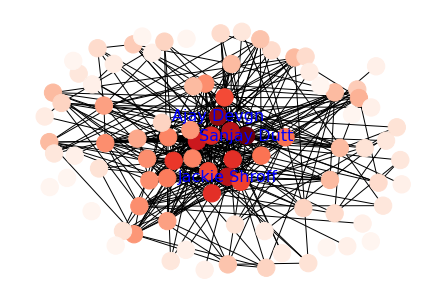

In [73]:
# Create and show network graph
pos = nx.spring_layout(g, k=1, iterations=20)
max_c = max(centrality.values())
color_map = {x[0]:x[1]/max_c for x in centrality.items() }
nx.draw(g, pos, node_color=list(color_map.values()), cmap=plt.cm.Reds) 
nx.draw_networkx_labels(g,pos,labels,font_size=16,font_color='Blue')
plt.show()

In [74]:
# Closeness centrality
centrality = nx.closeness_centrality (g, distance='weight')
t=[(ID_name_dict[x], centrality[x]) for x in sorted (centrality, key=centrality.get, reverse=True) [:10]]

In [75]:
df= pd.DataFrame(t)

In [76]:
df

,0,1
0,John Abraham,0.227865
1,Abhishek Bachchan,0.223397
2,Ajay Devgn,0.219101
3,Jackie Shroff,0.217706
4,Sanjay Dutt,0.217706
5,Akshay Kumar,0.217706
6,Sunny Deol,0.213624
7,Manoj Bajpayee,0.210986
8,Anil Kapoor,0.210986
9,Bobby Deol,0.204669


In [77]:
df.to_csv('data2.csv', index = False, encoding='utf-8')

In [78]:
[(ID_name_dict[x], [ID_title_dict[title] for title in name_title_dict[x]\
if title in ID_title_dict]) for x in sorted (centrality, key=centrality.get, reverse=True) [:10]]

[('John Abraham',
  ['Wazir',
   'Aetbaar',
   'Zinda',
   'Romeo Akbar Walter',
   'Welcome Back',
   'Dhoom',
   'Shootout at Wadala',
   'Satyameva Jayate',
   'Race 2',
   'Pagalpanti',
   'Dishoom',
   'Housefull 2',
   'Lakeer: Forbidden Lines',
   'Mumbai Saga',
   'Elaan',
   'Parmanu: The Story of Pokhran',
   'Paap',
   'Karam',
   'Satyameva Jayate 2',
   'Ek Villain Returns',
   'Force',
   'Madras Cafe',
   'Rocky Handsome',
   'Force 2',
   'Attack',
   'Batla House']),
 ('Abhishek Bachchan',
  ['Sarkar',
   'Sarkar Raj',
   'Bol Bachchan',
   'Sarkar 3',
   'Dhoom 2',
   'Dus',
   'Housefull 3',
   'Mumbai Se Aaya Mera Dost',
   'Yuva',
   'Zameen',
   'Run',
   'Dhoom',
   'The Legend of Drona',
   'Raavan',
   'Dum Maaro Dum',
   'Khelein Hum Jee Jaan Sey',
   'Game',
   'Players',
   'Dhoom 3',
   'Happy New Year',
   'Ludo']),
 ('Ajay Devgn',
  ['Major Saab',
   'Hindustan Ki Kasam',
   'Hum Kisi Se Kum Nahin',
   'Khakee',
   'Ram Gopal Varma Ki Aag',
   'Bol Bachch

In [79]:
labels = {}    
for x in sorted(centrality, key=centrality.get, reverse=True)[:3]:
        #set the node name as the key and the label as its value 
        labels[x] = ID_name_dict[x]

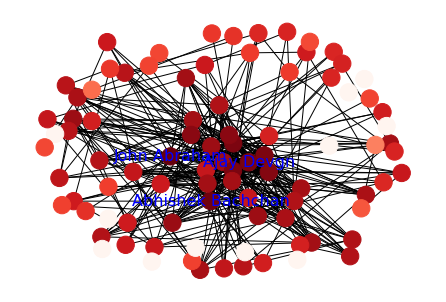

In [80]:
# Create and show network graph
pos = nx.spring_layout(g, k=1, iterations=20)
max_c = max(centrality.values())
color_map = {x[0]: x[1]/max_c for x in centrality.items() }
nx.draw(g, pos, node_color=list(color_map.values()), cmap=plt.cm.Reds)
nx.draw_networkx_labels(g,pos,labels,font_size=16,font_color='Blue')
plt.show()

In [81]:
# Betweenness centrality
centrality = nx.betweenness_centrality(g)
t=[(ID_name_dict[x], centrality[x]) for x in sorted (centrality, key=centrality.get, reverse=True) [:10]]

In [82]:
df= pd.DataFrame(t)

In [83]:
df

,0,1
0,Sanjay Dutt,0.105852
1,Ajay Devgn,0.094985
2,Abhishek Bachchan,0.060001
3,Jackie Shroff,0.059847
4,Akshay Kumar,0.057020
5,John Abraham,0.056851
6,Paresh Rawal,0.054412
7,Anupam Kher,0.052194
8,Sidharth Malhotra,0.039135
9,Manoj Bajpayee,0.038518


In [84]:
df.to_csv('data3.csv', index = False, encoding='utf-8')

In [85]:
labels = {}    
for x in sorted(centrality, key=centrality.get, reverse=True)[:3]:
        #set the node name as the key and the label as its value 
        labels[x] = ID_name_dict[x]

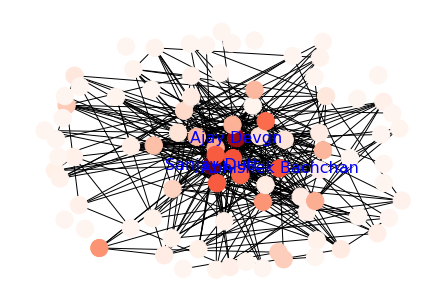

In [86]:
# Create and show network graph
pos = nx.spring_layout(g, k=1, iterations=20)
max_c = max(centrality.values())
color_map = {x[0]:x[1]/max_c for x in centrality. items() } 
nx.draw(g, pos, node_color=list(color_map.values()), cmap=plt.cm.Reds) 
nx.draw_networkx_labels(g,pos,labels,font_size=16,font_color='Blue')
plt.show()